# Markov Chain Monte Carlo and Parameter Measurement

The Markov chain is opten associated with Bayesian statistics.  

Baye's theorem:  $$P(A|B)=\frac{P(B|A) P(B)}{P(A)}$$


This isn't really radical.  Think of a case where we throw a normal dice(six sided- numbered 1 to 6) 60 times and an 8 sided dice (numbered 1 to 8) 40 times.  What is the probability of a throw both being one and being an 8 sided dice?  Obviously, this is 5/100.  But we can break it up as A=probability of throwing one, B= probability of throwing the 8 sided dice.    Then \begin{align}
P(A)&=&15/100\\
P(B)&=&40/100\\
P(A|B)&=&1/8\\
P(B|A)&=&1/3
\end{align}

For Bayesian statistics, we have P(A|B)= 'probability the value of a parameter is x given our measurement', P(B)= 'probability we measured the values of the data we measured', and P(B|A)= 'probability of the measurement given a value of a parameter'.    



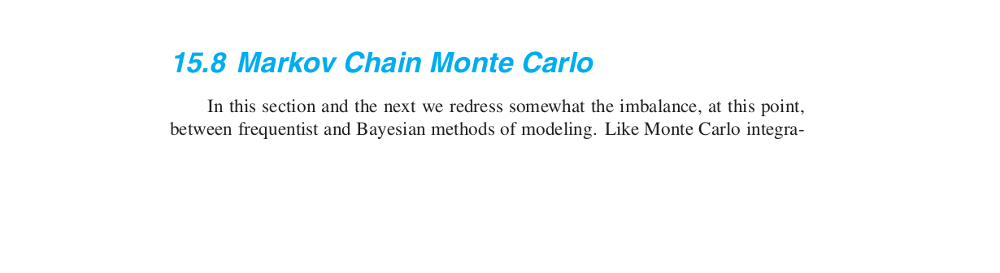
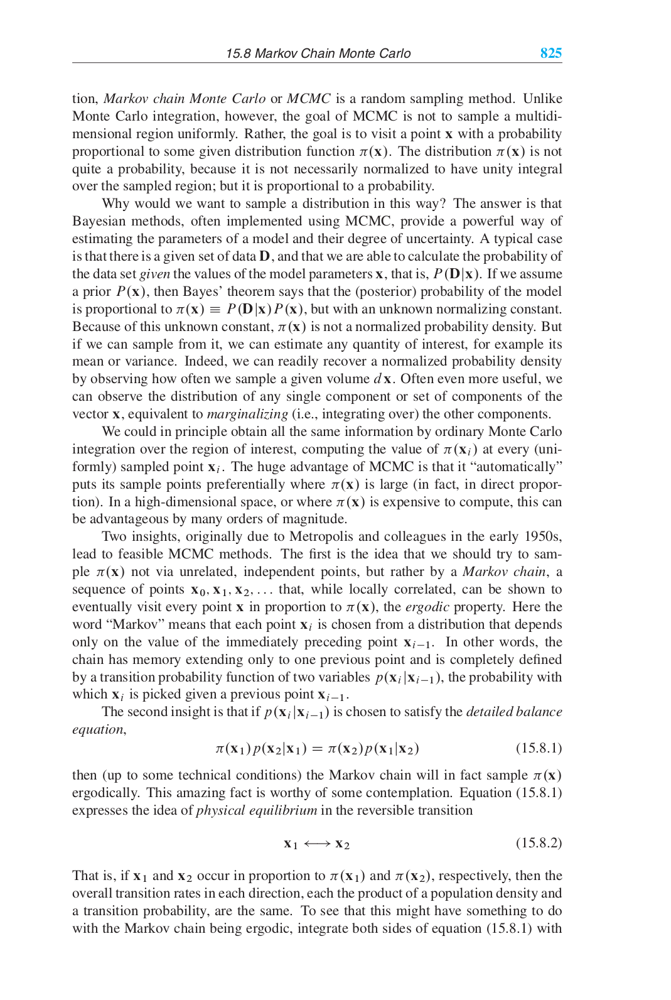
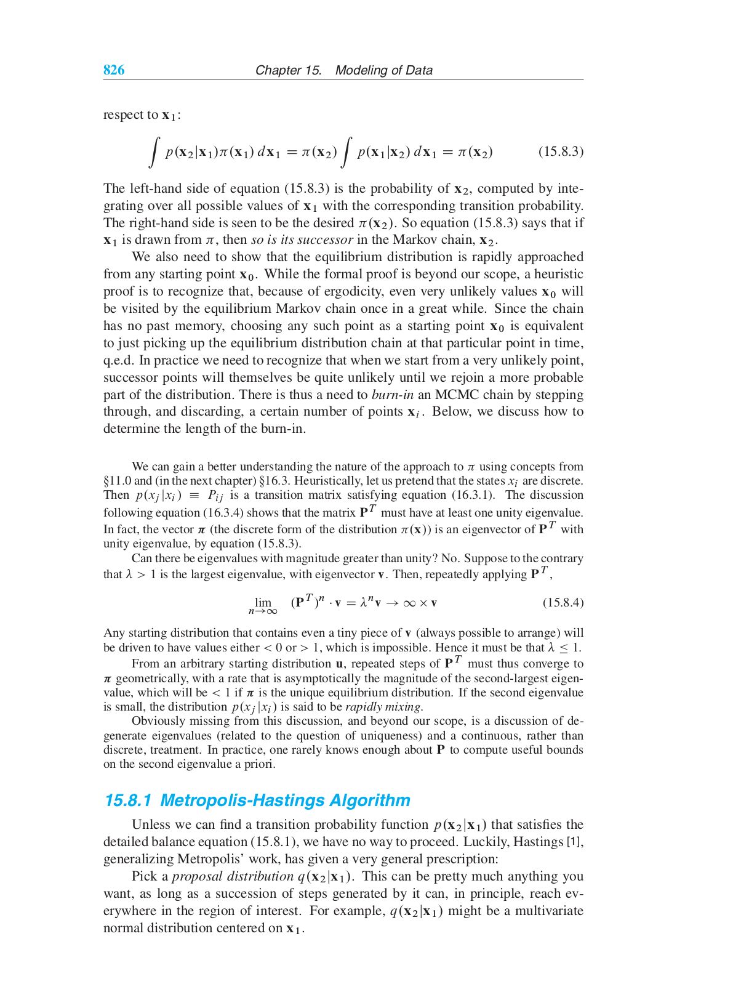
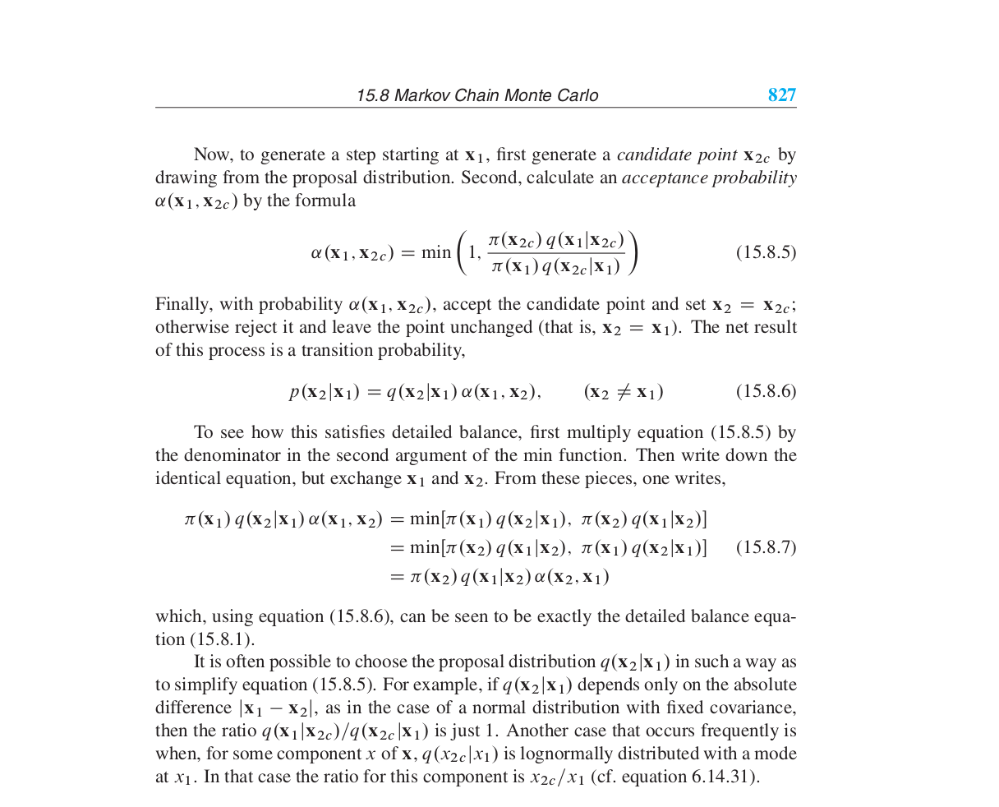

Fitting the pendulum again!



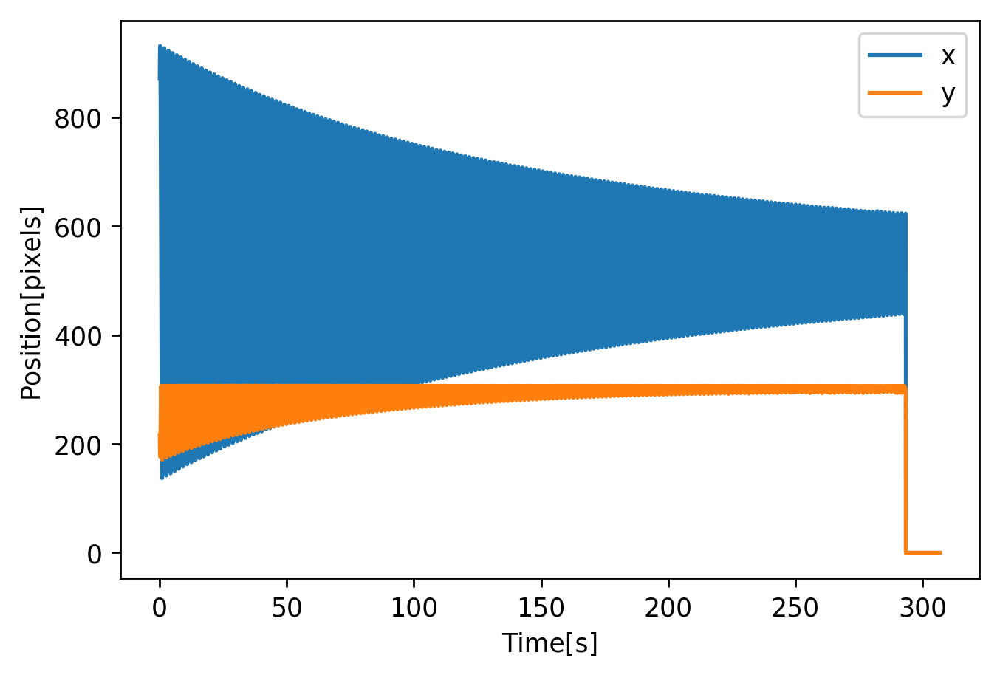

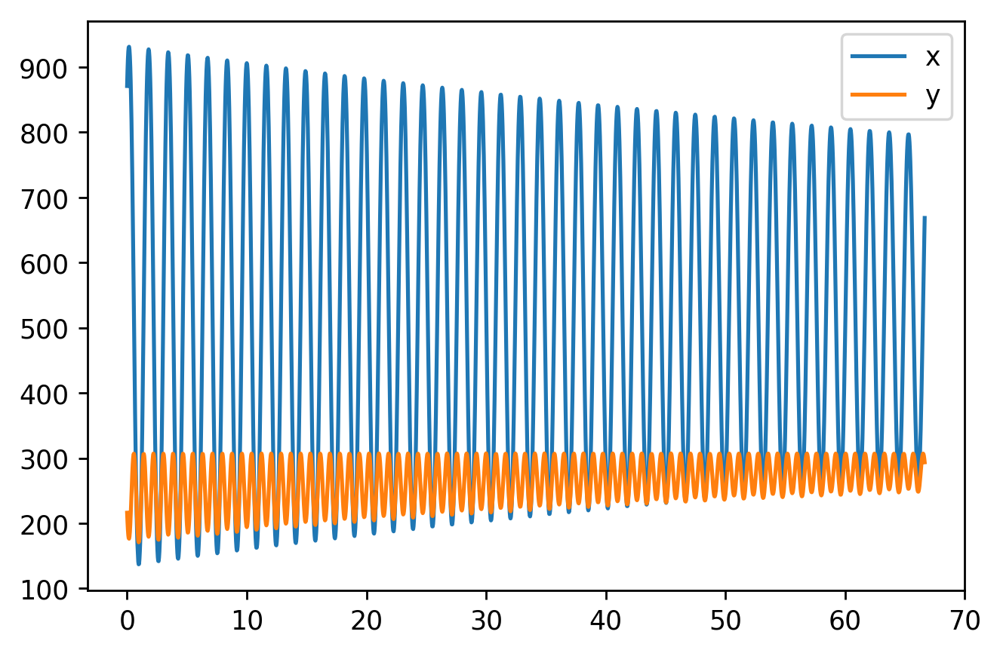

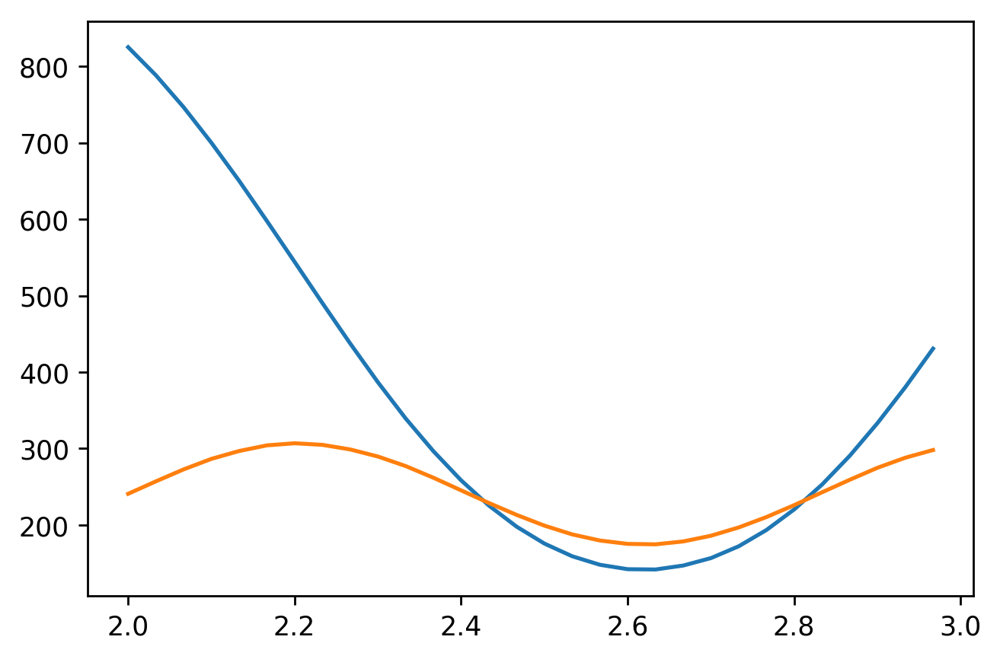

In [16]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rc('figure',dpi=250)

fps=30  #we could, perhaps, read this in from the movie and save it, but it is too much work for too little gain

x=np.load('xposLong.npy')
y=np.load('yposLong.npy')

t=np.linspace(0,len(x)/fps,len(x))
plt.figure()
plt.plot(t,x,label='x')
plt.plot(t,y,label='y')
plt.legend()
plt.xlabel('Time[s]')
plt.ylabel('Position[pixels]')
plt.figure()
plt.plot(t[:2000],x[:2000],label='x')
plt.plot(t[:2000],y[:2000],label='y')
plt.legend()
plt.figure()
t1=int(2*fps)
t2=3*fps
plt.plot(t[t1:t2],x[t1:t2])
plt.plot(t[t1:t2],y[t1:t2])


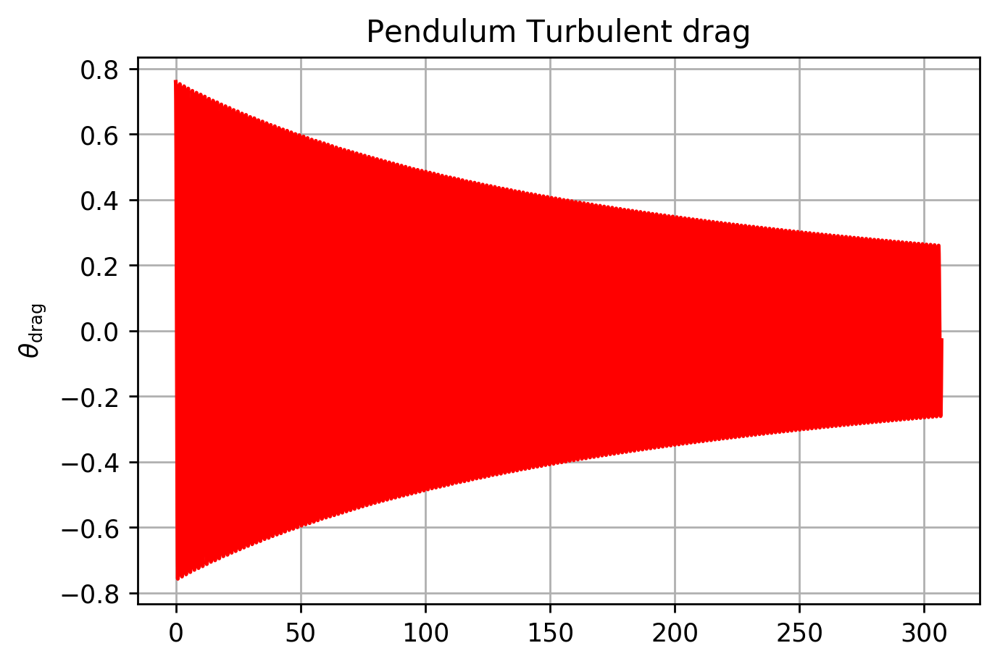

In [17]:
from scipy.integrate import odeint
from scipy.integrate import quadrature
import pendulumParameters as p

#and now we set up some constants (measured quantities)
l=p.l # #length of pendulum, meters
g=9.8 # acceleration of gravity on Earth's surface, meters/s**2
airViscosity=1.827e-5   #Pa-s  
mass=p.mMass #0.029 #kg  mass of pendulum bob
radius=p.dMass/2 #0.00949 #m radius of pendulum bob
wireDiameter=p.stringDiameter #0.00071 # m
b=6*np.pi*airViscosity*radius
airPressure=92.6 #kPa
standardAirDensity=1.225 # kg/m**3
standardAirPressure=101.325 #kPa
airDensity=airPressure/standardAirPressure*standardAirDensity
omega_0=np.sqrt(g/l)
T=2*np.pi/omega_0  #  period, seconds
theta_0=0.76


def ReynoldsNumber(velocity):
    '''Calculates Reynolds number for a pendulum of length l and angular velocity omega.  Because it is used 
    in an logarithmic interpolation, we impose 1 as a lower cutoff'''
    R=airDensity*velocity*radius*2/airViscosity
    return np.maximum(R,1)

RN=np.array([1,4,10,40,100,400,1000,2000,4000,10000])
DC=np.array([24,8,4,1.7,1.1,0.6,0.45,0.4,0.35,0.35])
import scipy.interpolate
logRN=np.log(RN)  #interpolation in log ReynoldsNumber will be more sensible
splineInterpolation=scipy.interpolate.interp1d(logRN,DC,kind='cubic',fill_value='extrapolate')

def DragCoefficientSpline(reynoldsNumber):
    return splineInterpolation(np.log(reynoldsNumber))

area=np.pi*radius**2
velocityAtR1=airViscosity/(2*airDensity*radius)
ceta= 6*np.pi*airViscosity*radius
ct=.5*airDensity*area
def fdrag(velocity):
    v=abs(velocity)
    if v<velocityAtR1:
        force=ceta*v
    else:
        force=ct*v**2*DragCoefficientSpline(ReynoldsNumber(v))
    return force
drag=np.vectorize(fdrag)  #so that drag can accept either a scalar or an array

wireData=np.array([20,1.88,50,1.57,100,1.39,200,1.25,500,1.10,1000,.972,2000,.876,5000,.972,10000,1.092,20000,1.164,50000,1.178,100000,1.164]).reshape(12,2)
logWireData=np.log(wireData[:,0])  #interpolation in log ReynoldsNumber will be more sensible
interpolation=scipy.interpolate.interp1d(logWireData,wireData[:,1],kind='cubic',fill_value='extrapolate')
def DragWire(reynoldsNumber):
    return interpolation(np.log(reynoldsNumber))

v20=20*airViscosity/(wireDiameter*airDensity)
v20_Coefficient=DragWire(20)*airDensity*v20*wireDiameter/2
def dWireForce_Scalar(velocity):
    v=abs(velocity)  #we make all velocities positive for this calculation
    if(v<v20):
        dforce=v20_Coefficient*v
    else:
        reynoldsNumber=airDensity*v*wireDiameter/airViscosity
        dforce=DragWire(reynoldsNumber)*airDensity*v**2*wireDiameter/2  #units are N/m since we put dz=1
    return dforce

dWireForce=np.vectorize(dWireForce_Scalar)



def dTorque(rPrime,omega):
    '''Calculates the torque from an element of wire at rprime moving with angular velocity omega'''
    return rPrime*dWireForce(rPrime*omega)
vdTorque=np.vectorize(dTorque)

def wireTorque(anOmega):
    om=np.abs(anOmega)
    if(np.isscalar(om)):
        return quadrature(dTorque,0,l,args=omyy)
    else:
        retval=np.zeros_like(om)
        for i in np.arange(0,om.size):
            retval[i]=quadrature(vdTorque,0,l,args=om[i])[0]
        return retval
    
def ChebyshevCoefficients(func,a,b,n):
    '''Evaluate n chebyshev coefficients for func evaluated between a and b;  based on NR 5.8.7'''
    range=0.5*(b-a)  
    average=0.5*(b+a)
    x=range*np.cos((np.arange(0,n)+0.5)*np.pi/n)+average  #maps from -1 to 1 onto a-b
    v=func(x).reshape(1,n)  #row array of function values
    A=np.cos(np.pi/n*np.arange(0,n)*((np.arange(0,n)+0.5)).reshape(n,1))
    C=np.dot(v,A)*2/n 
    return C
    
    
def ChebEval(x,c,a,b):
    '''Evaluate a chebyshev series c(x), for the range a-b'''
    range=0.5*(b-a)
    average=0.5*(a+b)
    mapped=(x-average)/range
    return np.polynomial.chebyshev.chebval(mapped,c)-c[0]/2

omegaArray=np.linspace(0,10,500)
ChebyshevCoefficientsForWireTorque=ChebyshevCoefficients(wireTorque,omegaArray[0],omegaArray[-1],60).reshape(60,)

def wireTorqueCheb(x):
    return ChebEval(np.abs(x),ChebyshevCoefficientsForWireTorque[:10],omegaArray[0],omegaArray[-1])

def pendulumWithTurbulentDragAndString(y,t):
    theta, omega,energy = y
    dydt = np.array([omega, 
                     - g/l*np.sin(theta)-(drag(l*omega)/(mass*l)
                      +wireTorqueCheb(l*omega)/(mass*l**2))*np.sign(omega),
                     (drag(l*omega)*l+wireTorqueCheb(l*omega))*np.abs(omega)])
    return dydt
#use f0 for the initial conditions
f0 = np.array([theta_0, 0.0,0.0])
                     
dragSolutionWithTurbulenceAndString = odeint(pendulumWithTurbulentDragAndString, f0, t)

plt.figure()
plt.title('Pendulum Turbulent drag')
plt.ylabel(r'$\theta_{\rm{drag}}$')
#axarr[0].plot(t, solrk[:, 0], 'k', label='rk omega(t)')
plt.plot(t, dragSolutionWithTurbulenceAndString[:, 0], 'r', label='rk theta(t)')
plt.grid()


In [18]:
neval=0
def pendulum(y,t,*pargs):
    theta, omega= y
    g,alpha=pargs
    global neval
    neval=neval+1
    if(neval<1):
        print(neval,theta,omega,g,l,mass,alpha)

    dydt = np.array([omega, 
                     - g/l*np.sin(theta)-(alpha*drag(l*omega)/(mass*l)
                      +alpha*wireTorqueCheb(l*omega)/(mass*l**2))*np.sign(omega)])
    return dydt

def Chi2xy(parameters,t,x,y,lpixel,x0,y0,showSolution):
    global sol # so we can plot out the solution
    global neval

    dt,theta0,g,alpha,delta=parameters
    print('x0 %f y0 %f dt %g theta0 %g g %g alpha %g delta %f lpixel %f'%(x0,y0,dt,theta0,g,alpha,delta,lpixel))
    f0 = np.array([theta0, 0.0])
    tprime=np.linspace(t[0]-dt,t[0],2)
    pargs=(g,alpha)
    neval=0
    sol0=odeint(pendulum,f0,tprime,args=pargs) #integrate to dt                  
    sol = odeint(pendulum, sol0[-1], t,args=pargs)
    theta=sol[:,0]+delta
    chi2=np.sum((x0+lpixel*np.sin(theta)-x)**2+ (y0+lpixel*np.cos(theta)-y)**2)
    print('neval=',neval,'chi2= %g'%chi2)
    if showSolution:
        plt.figure()
        plt.title('X Solution before delta-t shift')
        plt.plot(t,x0+lpixel*np.sin(sol[:,0]))
        plt.figure()
        plt.title('Calculated x position')
        plt.plot(t,x0+lpixel*np.sin(theta),label='model')
        plt.plot(t,x,label='data')
        plt.legend()
        plt.figure()
        plt.title('Calculated y position')
        plt.plot(t,y0+lpixel*np.cos(theta),label='model')
        plt.plot(t,y,label='data')
        plt.legend()

    return chi2

#second version to fit for lpixel, x0,y0, delta
def Chi2XY2(parameters,t,x,y,dt,theta0,g,alpha,showSolution):
    lpixel,x0,y0,delta=parameters
    return Chi2xy((dt,theta0,g,alpha,delta),t,x,y,lpixel,x0,y0,showSolution)

m=3*30
n=1000
x0=531.2
y0=306.55
fitParameters=np.array([x0,y0,0.6,0.7,9.8,1.0])
args=(t[m:n],x[m:n],y[m:n])


Now we set up to generate the Metropolis-Hastings steps.  

We need x0,y0, dt, theta0,g, alpha,delta,lpixel and a step size.

In [20]:
# start by defining the various steps
pstep={'t':0.1,'theta0':0.1,'g':0.1,'alpha':0.05,'delta':0.01,'lpixel':10,'x0':10,'y0':10}
sigma=np.array([0.1,0.1,0.1,0.05,0.01,1,1,1])
sigma=sigma  # May want to decrease this as the chain progresses by dividing by 10 or 20
chi2=1e10
def MHStep(pars):
    global chi2
    newpars=np.random.normal(size=len(pars))*sigma+pars
    candidatechi2=Chi2xy(newpars[0:5],t,x,y,newpars[5], newpars[6],newpars[7],False)/2
    aa=np.random.rand()
    print(aa,candidatechi2,chi2)
    if np.exp(chi2-candidatechi2)>aa:
        chi2=candidatechi2
        pars=newpars
        print('shift')
    else:
        print('no shift')
    return pars

start=np.array([0,.6,9.6,1.0,0.01,628,530,-320])


In [21]:
np.random.rand()


0.4987352096611066

In [22]:
steps=[]
probs=[]
p=MHStep(start)
for i in range(0,50):
    p=MHStep(p)
    steps.append(p)
    probs.append(chi2)
    print(i,'prob=',chi2)

x0 529.216725 y0 -320.534884 dt 0.0165357 theta0 0.738671 g 9.74576 alpha 1.04014 delta 0.017313 lpixel 628.503241
neval= 35036 

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: overflow encountered in exp
  if sys.path[0] == '':


chi2= 6.25846e+08
0.3090209153321505 312922760.849 10000000000.0
shift
x0 529.585791 y0 -320.888699 dt -0.0541321 theta0 0.774609 g 9.63482 alpha 1.09522 delta 0.027694 lpixel 628.862235
neval= 34970 chi2= 6.81803e+08
0.49203495819078347 340901405.137 312922760.849
no shift
0 prob= 312922760.849
x0 529.973617 y0 -319.189022 dt -0.0306147 theta0 0.688277 g 9.63698 alpha 1.06816 delta 0.021138 lpixel 627.692188
neval= 34165 chi2= 6.14147e+08
0.314947916048649 307073449.675 312922760.849
shift
1 prob= 307073449.675
x0 532.000794 y0 -317.801986 dt 0.195023 theta0 0.755756 g 9.60422 alpha 1.1608 delta 0.019097 lpixel 626.997162
neval= 35406 chi2= 6.23041e+08
0.3507720310255472 311520666.791 307073449.675
no shift
2 prob= 307073449.675
x0 530.316105 y0 -319.484323 dt -0.00904446 theta0 0.716583 g 9.77579 alpha 1.0131 delta 0.028543 lpixel 629.206224
neval= 34127 chi2= 6.16453e+08
0.673456593421677 308226681.522 307073449.675
no shift
3 prob= 307073449.675
x0 531.110359 y0 -317.160518 dt -0.1

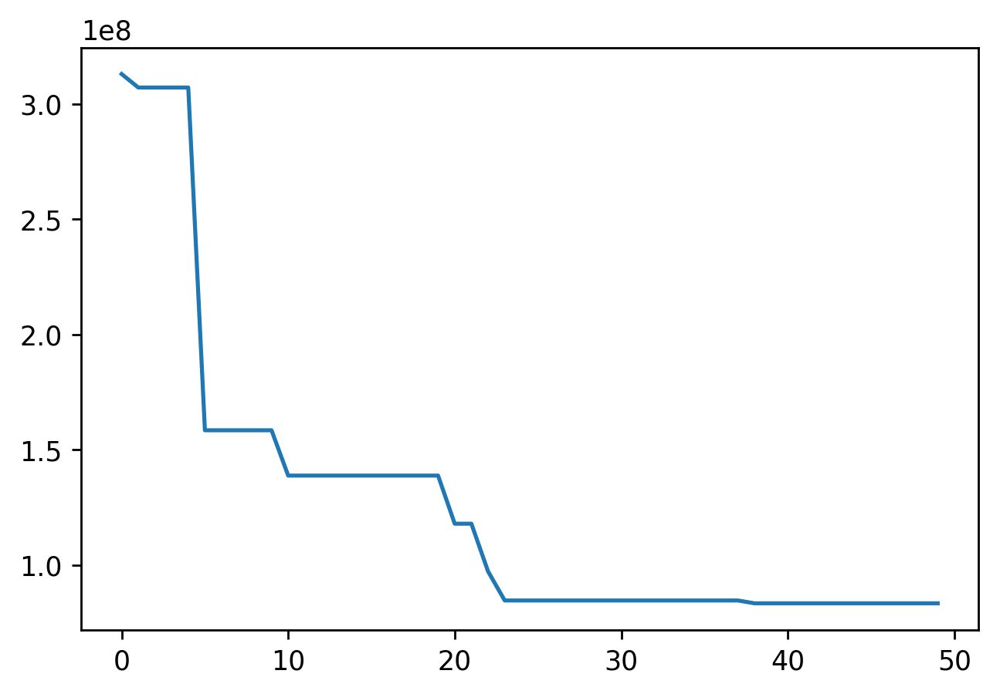

In [23]:

plt.plot(probs)

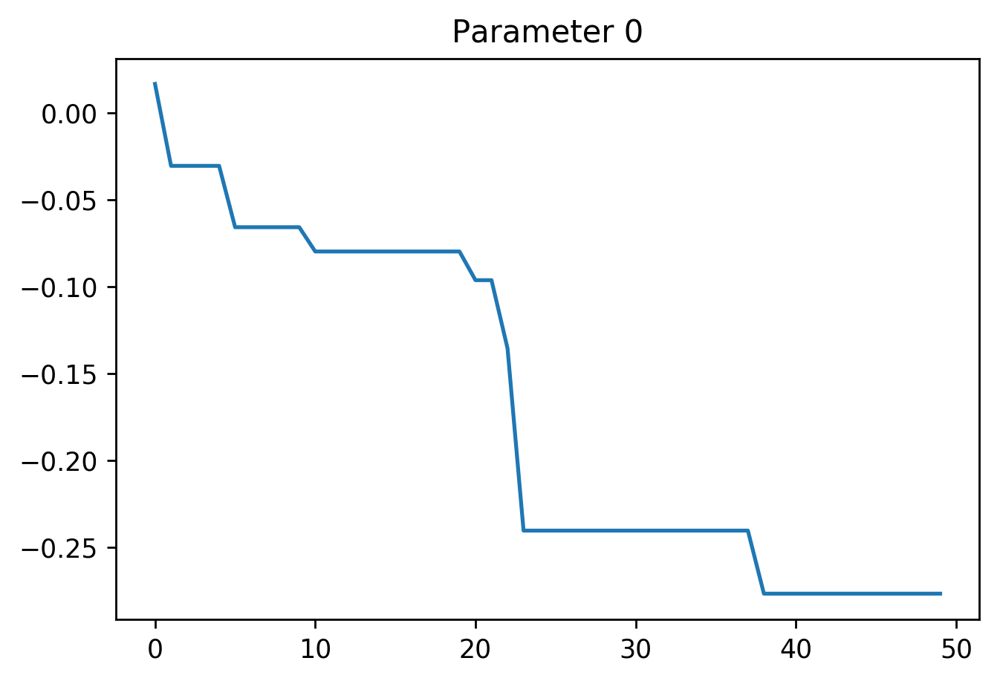

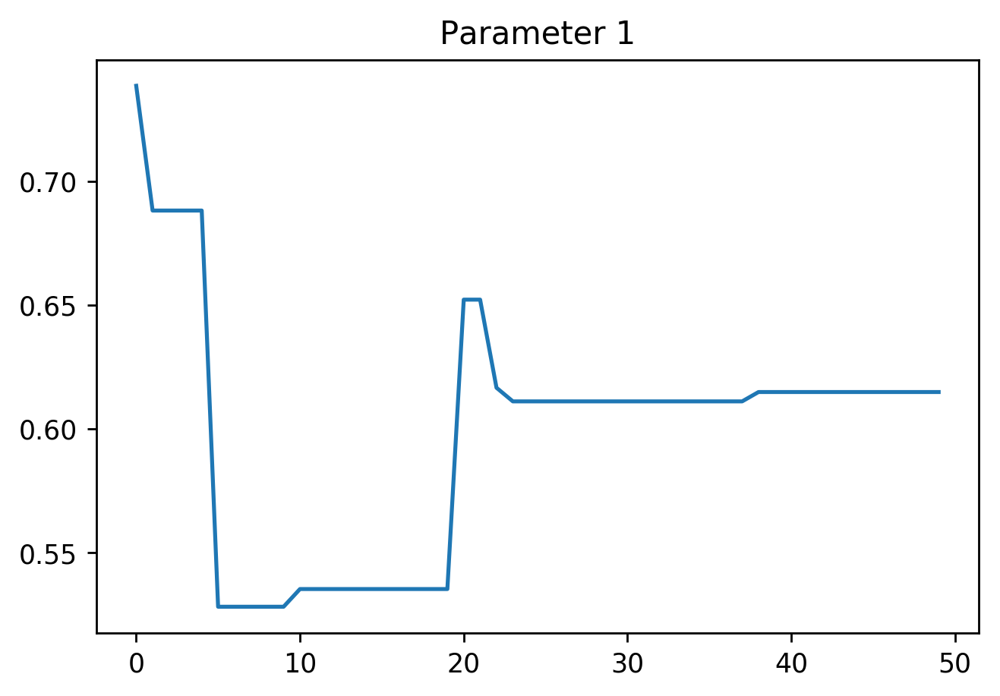

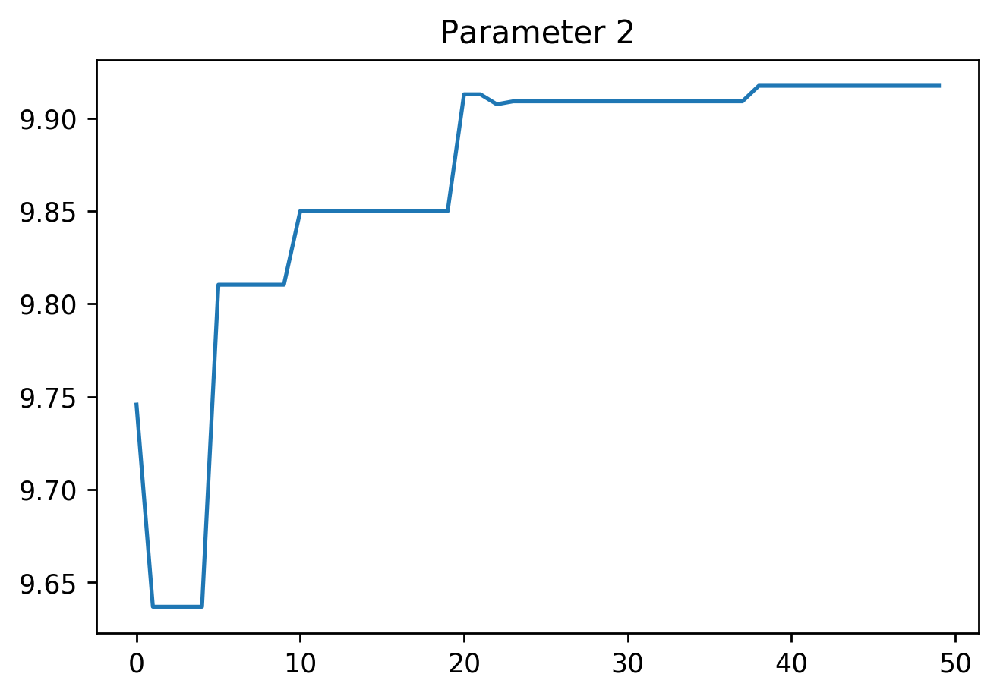

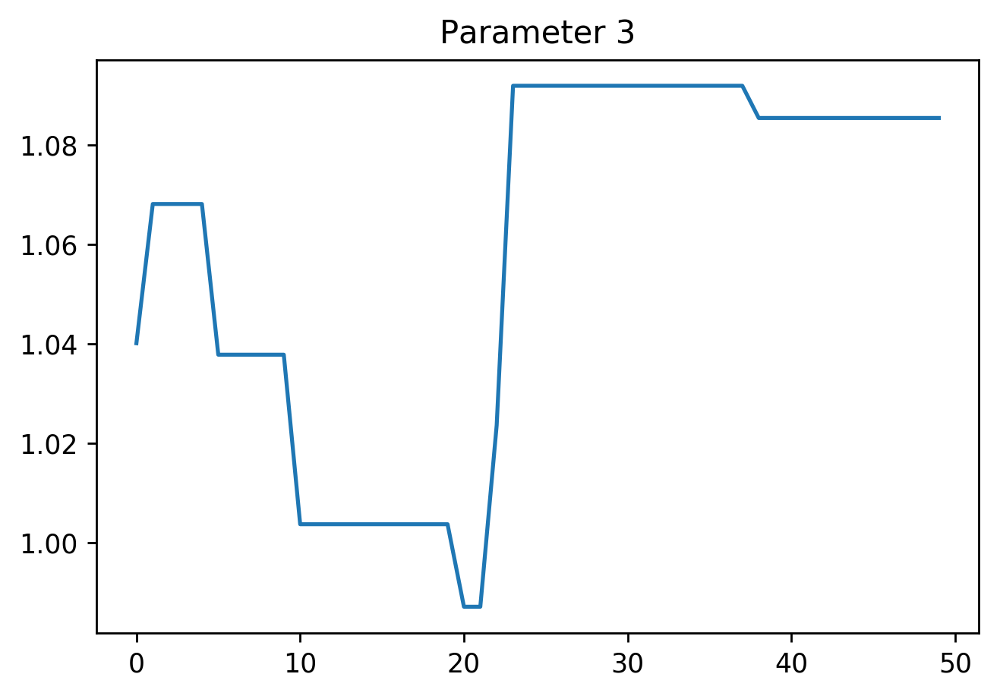

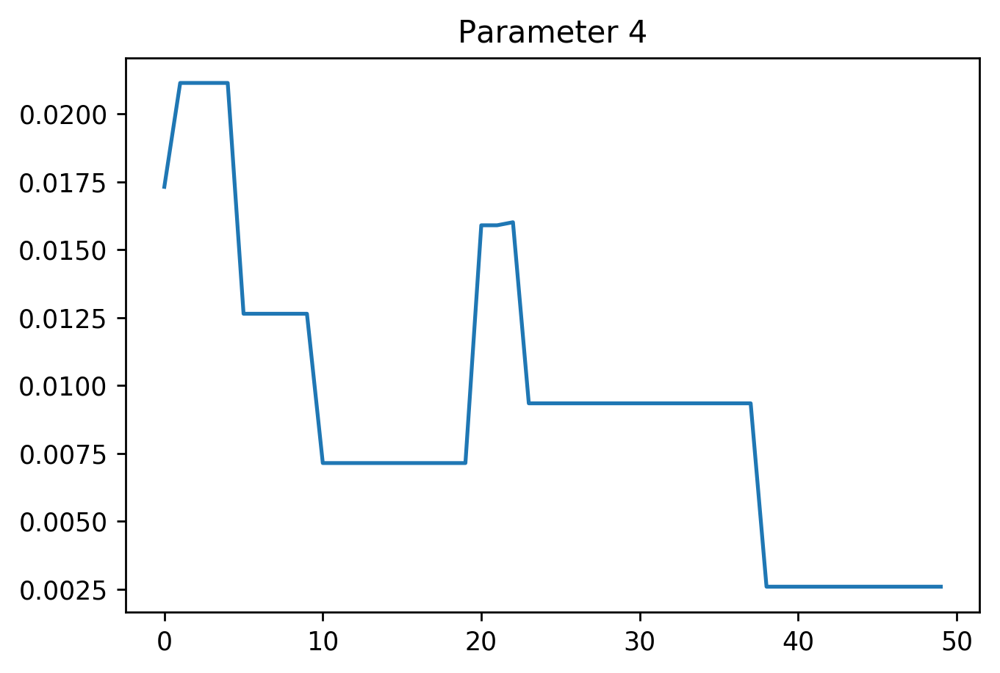

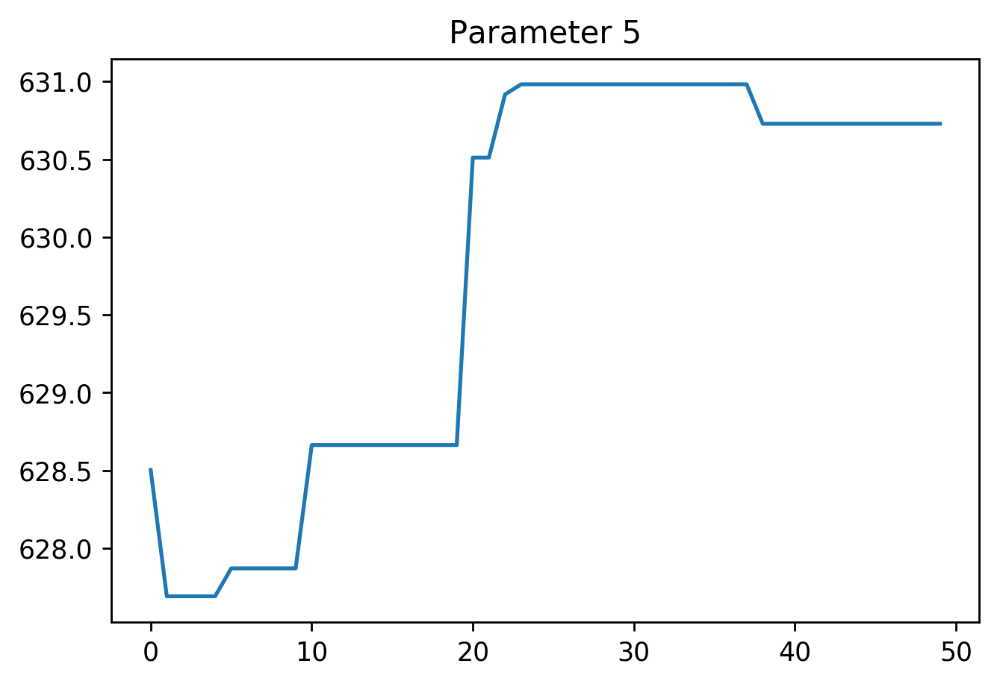

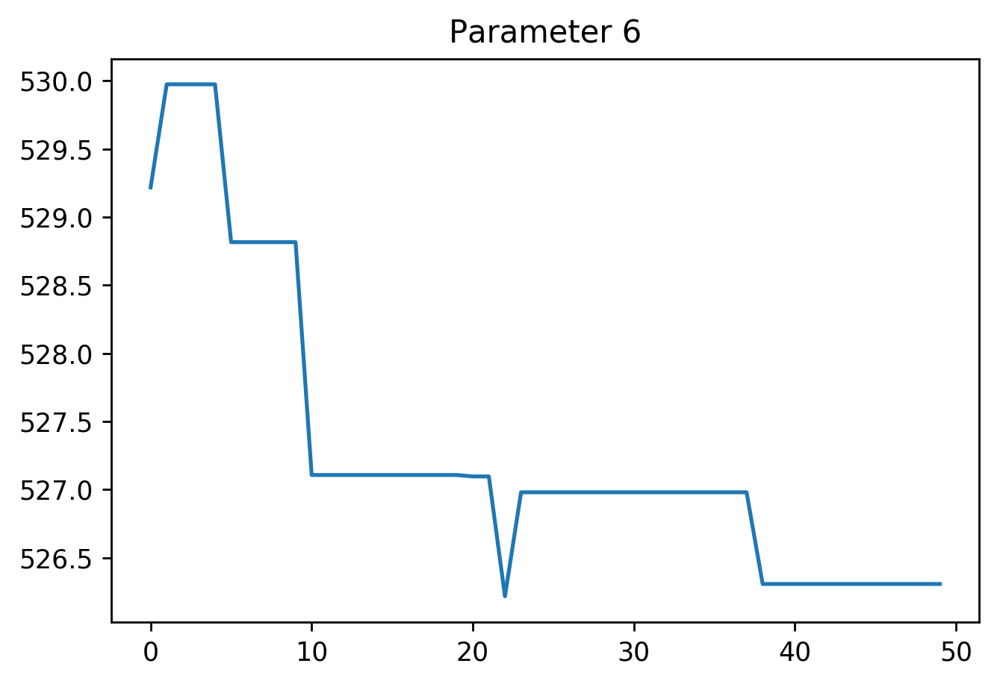

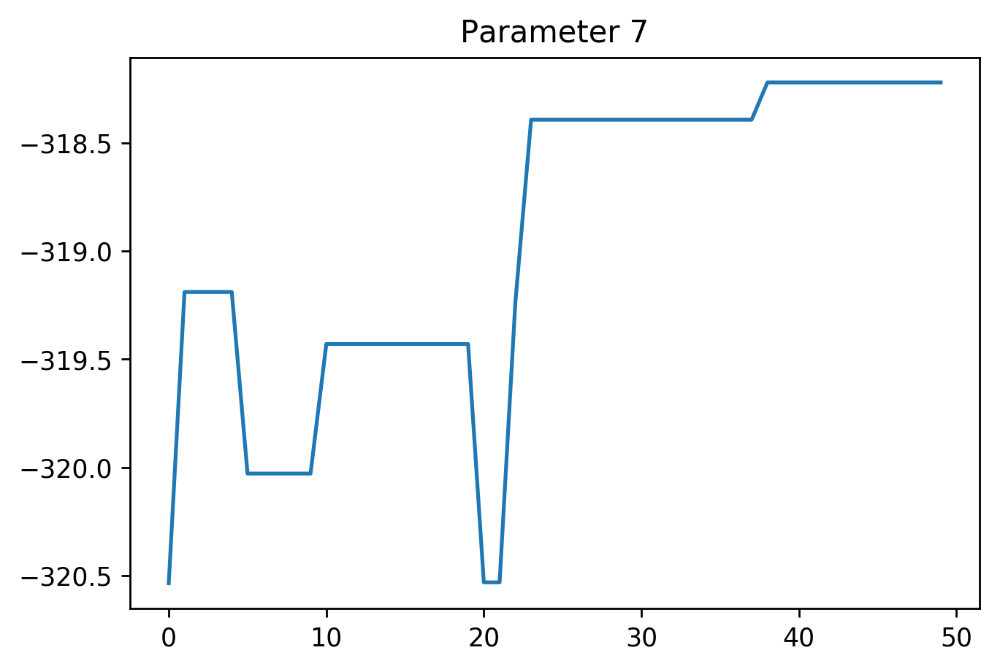

In [24]:
stp=np.array(steps)
for j in range(0,8):
    plt.plot(stp[:,j])
    plt.title('Parameter %d'%j)
    plt.show()



In [ ]:
import pickle
p=MHStep(steps[-1])
for i in range(0,50000):
    p=MHStep(p)
    steps.append(p)
    probs.append(chi2)
    print(i,'prob=',chi2)
    if i%1000==0 and i>0:
        with open('mcmc3.pickle','wb')as f:
            pickle.dump((steps,probs,sigma),f)
            print('dump ',i)


x0 528.716270 y0 -325.656911 dt -0.144458 theta0 0.682919 g 9.87434 alpha 1.7504 delta -0.035183 lpixel 621.473469
neval= 37810 chi2= 1.48354e+08
0.7312828407299354 74177052.26693344 73403243.2217016
no shift
x0 528.709677 y0 -325.651370 dt -0.139922 theta0 0.67681 g 9.88244 alpha 1.74837 delta -0.036106 lpixel 621.438755
neval= 38162 chi2= 1.52485e+08
0.17421324299287266 76242331.620769 73403243.2217016
no shift
0 prob= 73403243.2217016
x0 528.642314 y0 -325.752066 dt -0.148073 theta0 0.68386 g 9.87457 alpha 1.74544 delta -0.034846 lpixel 621.467862
neval= 38384 chi2= 1.4949e+08
0.994214787135089 74745194.64337169 73403243.2217016
no shift
1 prob= 73403243.2217016
x0 528.646862 y0 -325.657424 dt -0.138917 theta0 0.678702 g 9.88515 alpha 1.74566 delta -0.035603 lpixel 621.479522
neval= 37855 chi2= 1.55112e+08
0.12680816643911574 77555963.91330157 73403243.2217016
no shift
2 prob= 73403243.2217016
x0 528.744589 y0 -325.682064 dt -0.141259 theta0 0.680189 g 9.87947 alpha 1.74728 delta -0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: overflow encountered in exp
  if sys.path[0] == '':


neval= 38094 chi2= 1.48966e+08
0.4080956330105825 74482818.81171143 73400531.33884981
no shift
483 prob= 73400531.33884981
x0 528.654227 y0 -325.671740 dt -0.132089 theta0 0.679364 g 9.87709 alpha 1.74834 delta -0.034554 lpixel 621.548974
neval= 37984 chi2= 1.47364e+08
0.9288850193144217 73681884.72310618 73400531.33884981
no shift
484 prob= 73400531.33884981
x0 528.639479 y0 -325.639405 dt -0.153934 theta0 0.685328 g 9.88249 alpha 1.75354 delta -0.034811 lpixel 621.409265
neval= 37838 chi2= 1.47833e+08
0.8272880933299747 73916671.26740204 73400531.33884981
no shift
485 prob= 73400531.33884981
x0 528.658943 y0 -325.612494 dt -0.140527 theta0 0.681975 g 9.86494 alpha 1.75154 delta -0.035768 lpixel 621.463065
neval= 37857 chi2= 1.60455e+08
0.5810197216620849 80227448.26938473 73400531.33884981
no shift
486 prob= 73400531.33884981
x0 528.575267 y0 -325.666619 dt -0.140148 theta0 0.678945 g 9.8773 alpha 1.75683 delta -0.034863 lpixel 621.476986
neval= 38263 chi2= 1.4725e+08
0.3662899188569

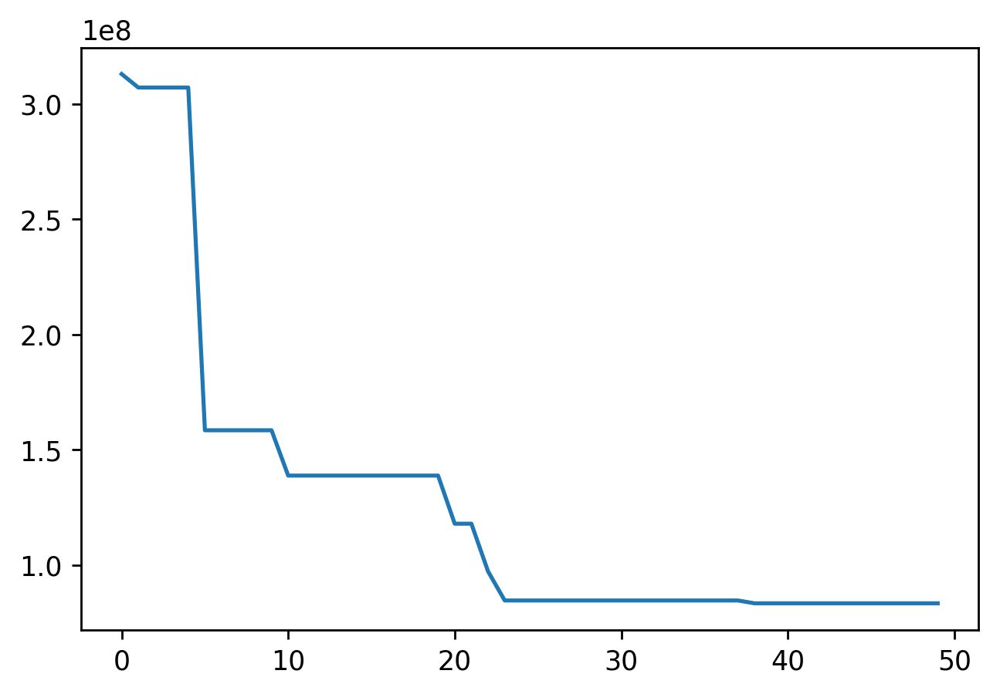

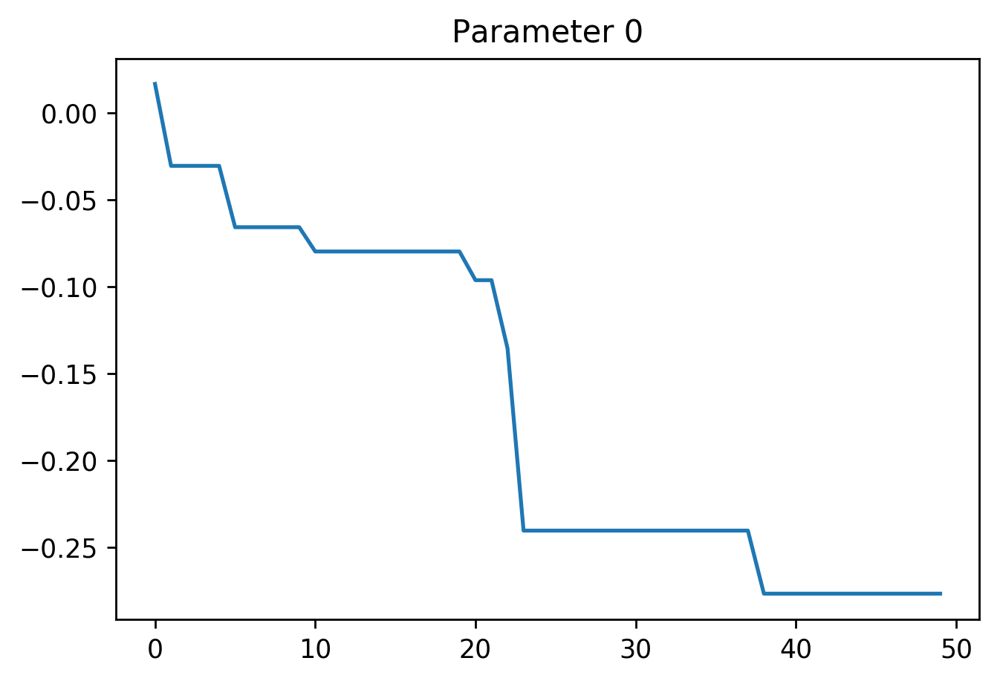

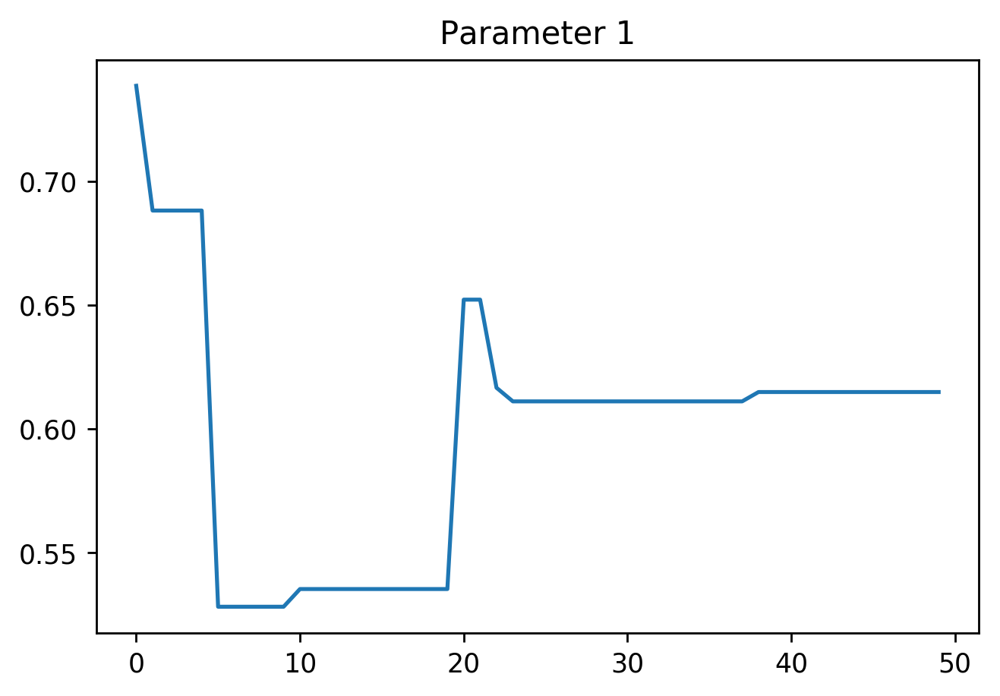

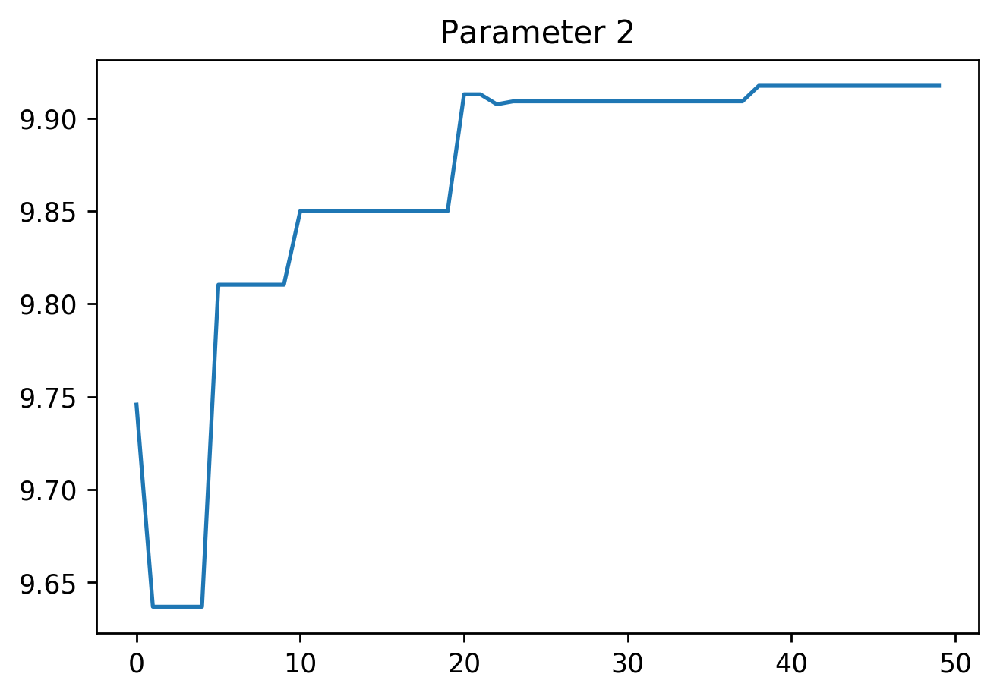

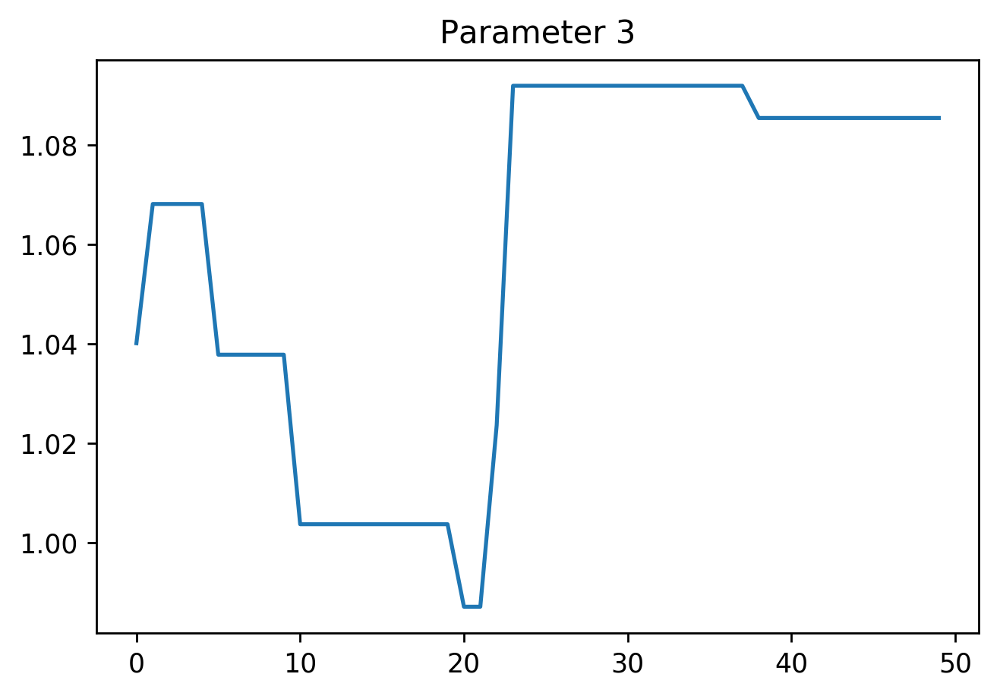

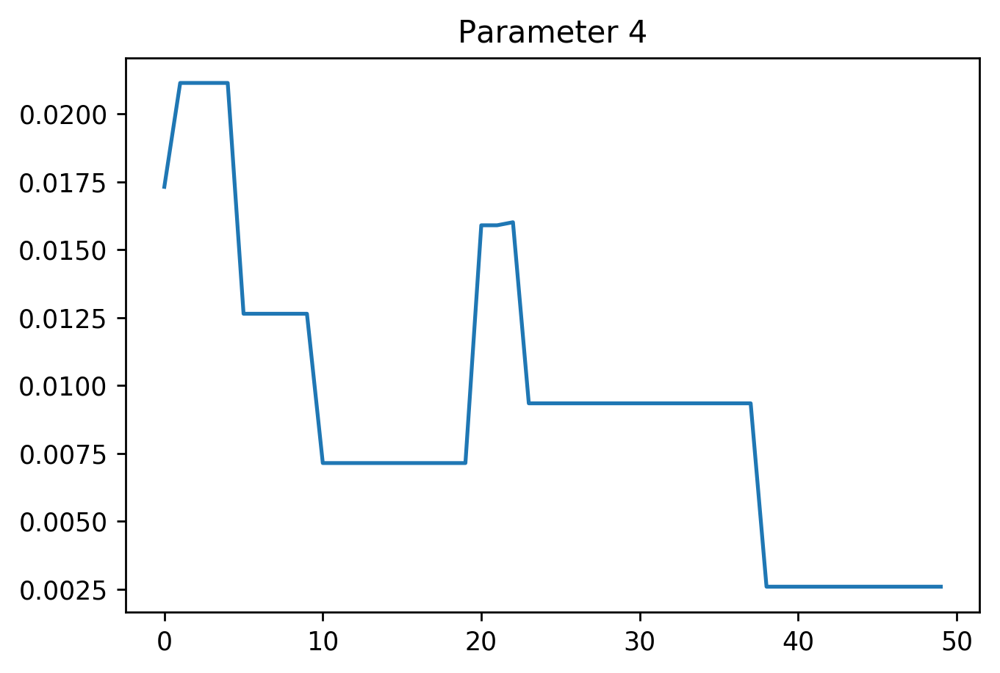

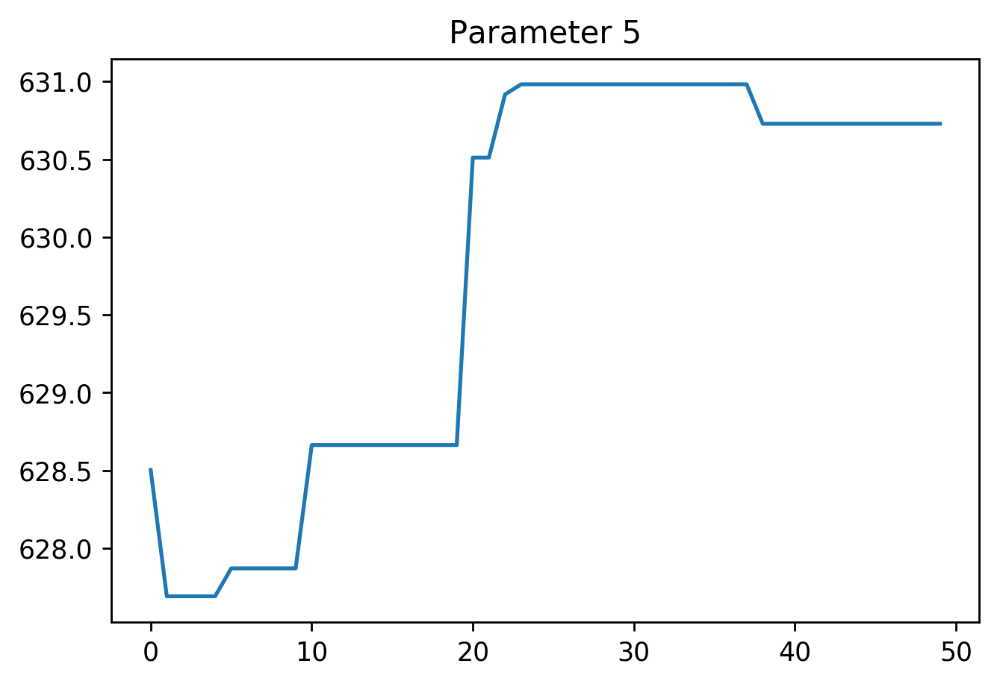

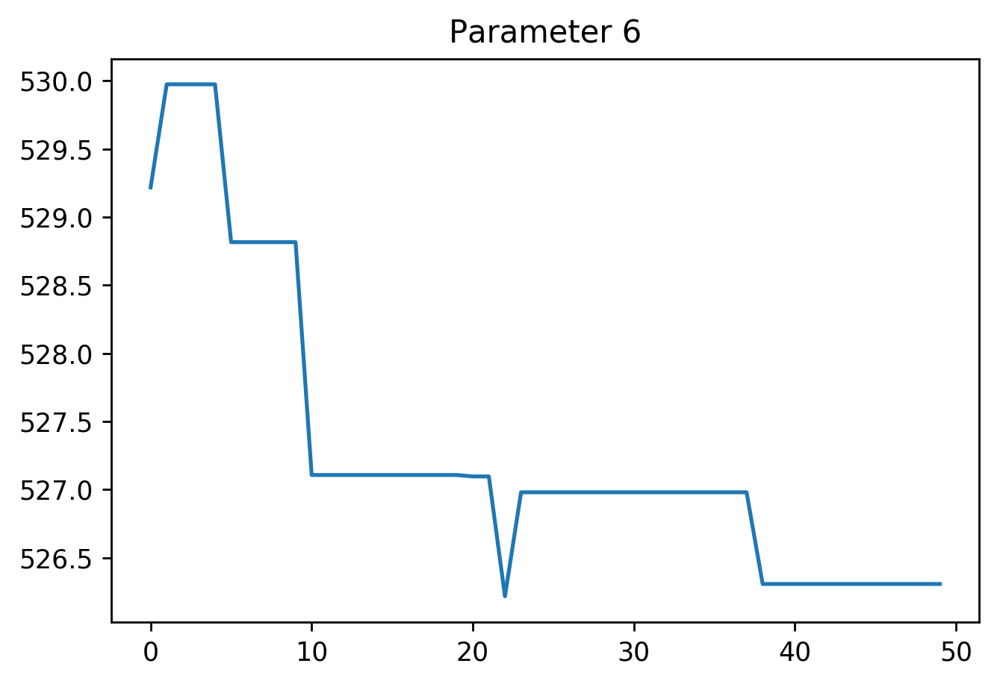

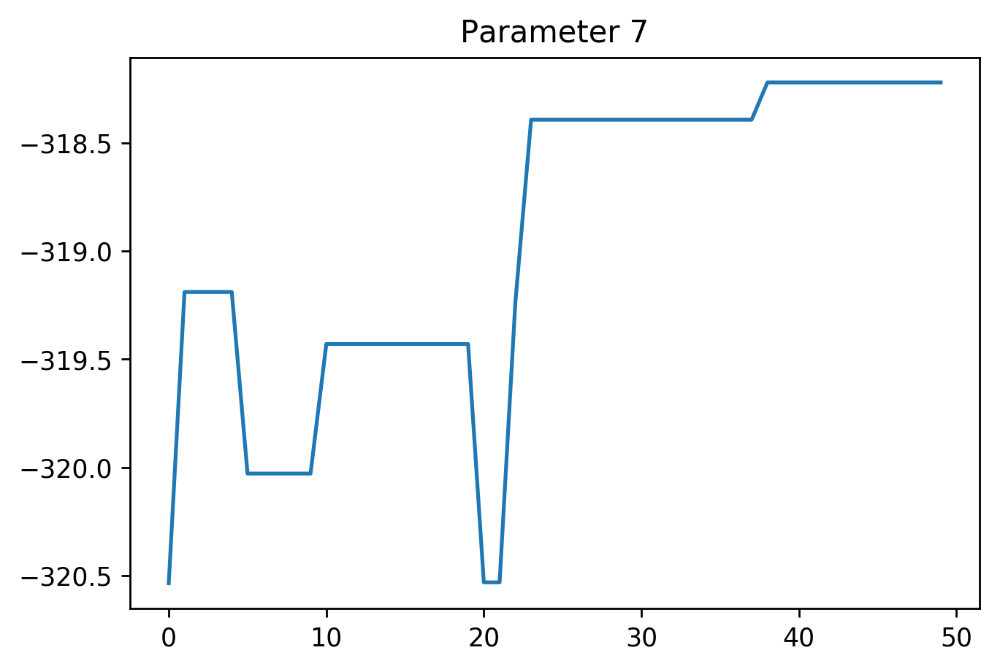

In [25]:
import pickle

with open('mcmc.pickle','wb')as f:
    pickle.dump((steps,probs,sigma),f)


plt.plot(probs)
plt.show()
stp=np.array(steps)
for j in range(0,8):
    plt.plot(stp[:,j])
    plt.title('Parameter %d'%j)
    plt.show()

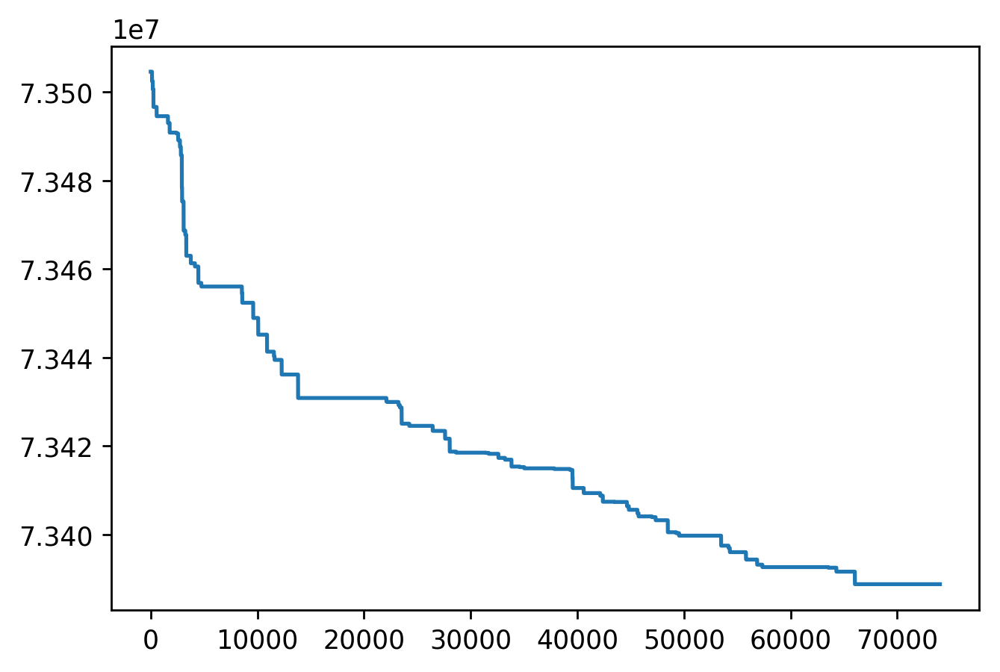

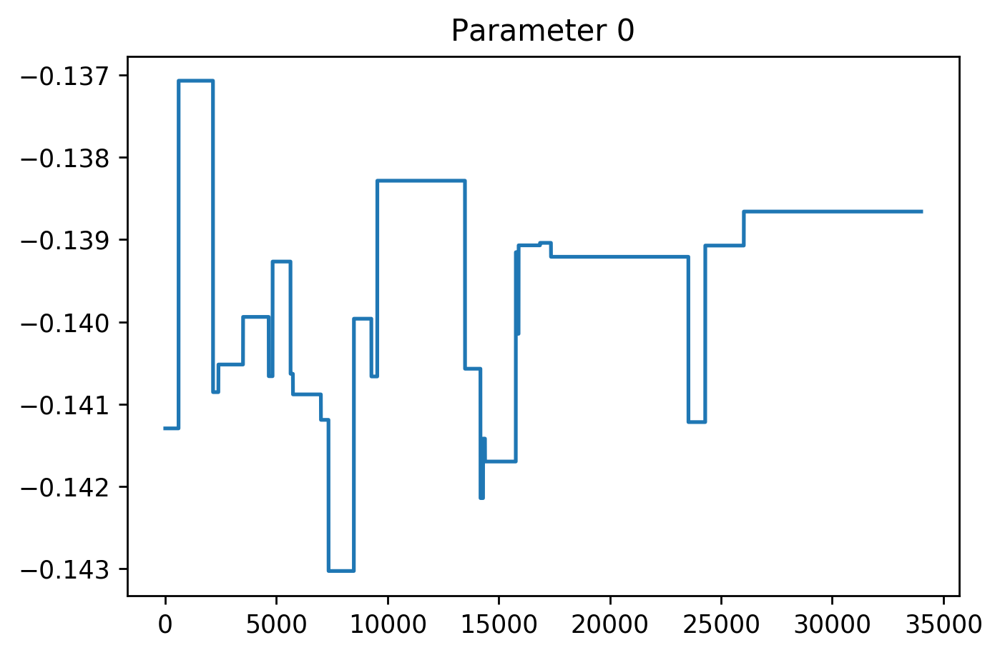

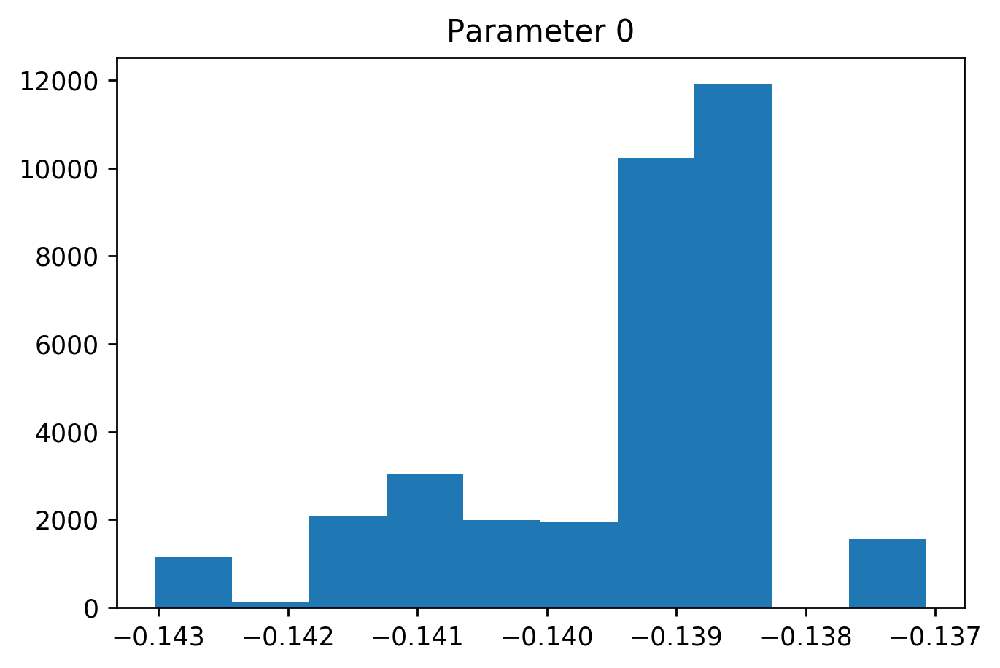

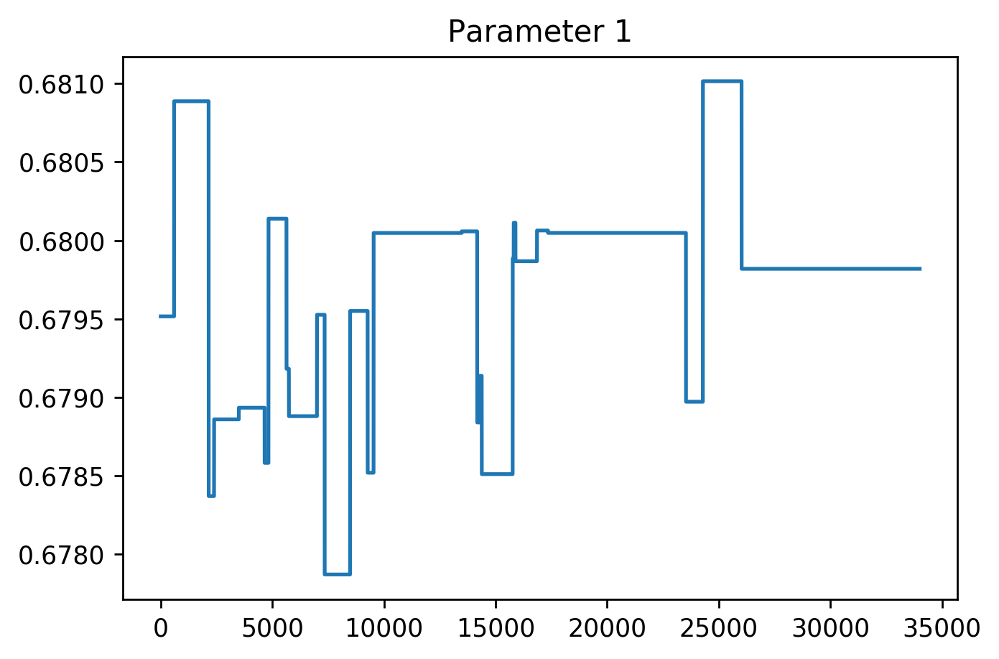

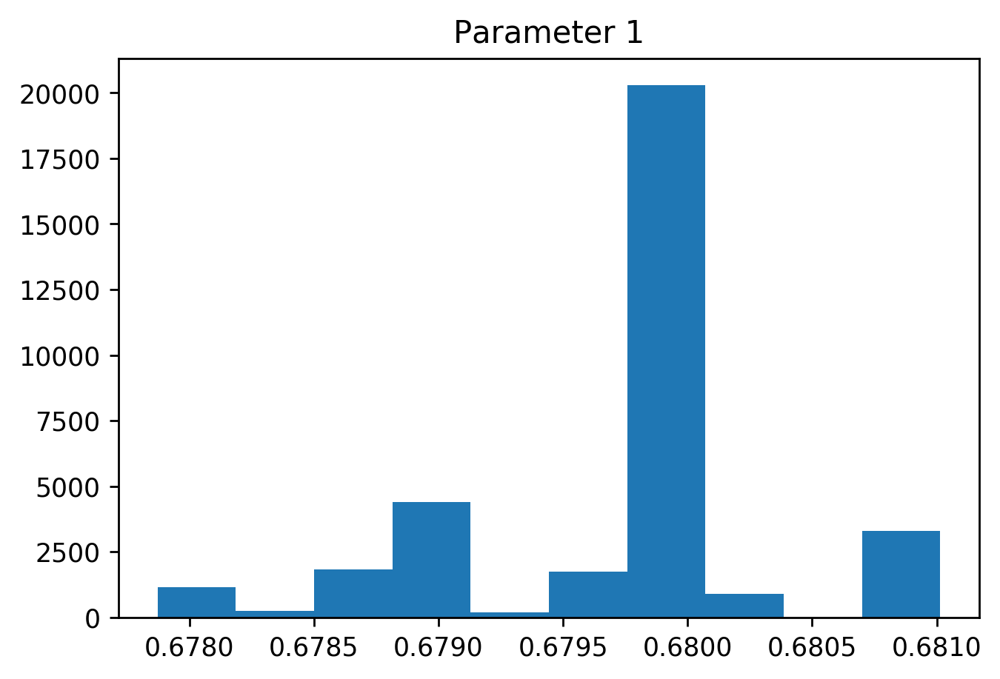

...

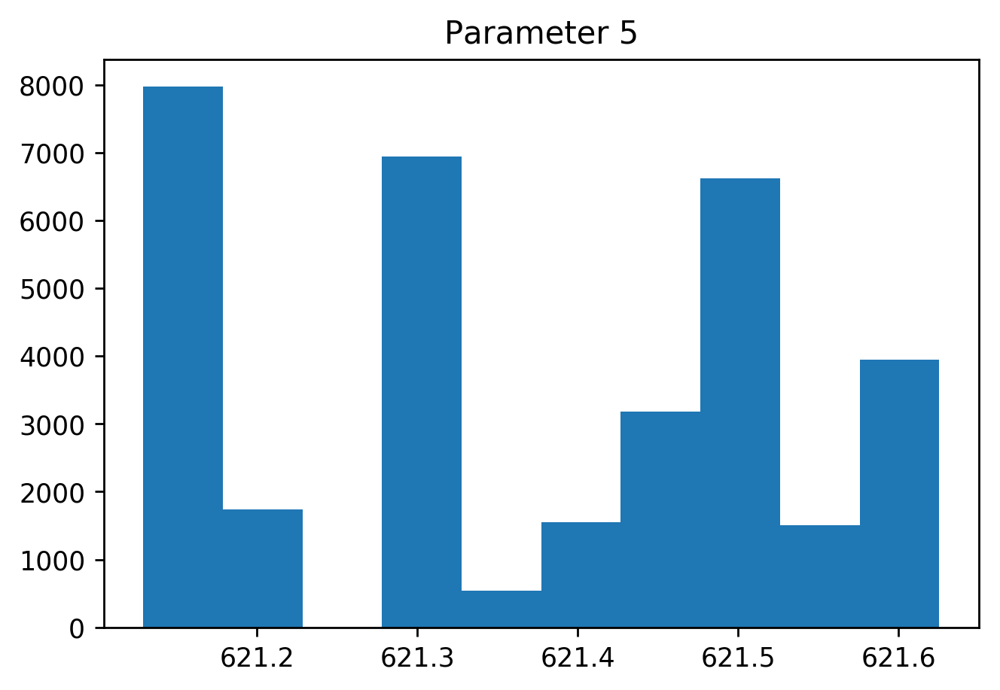

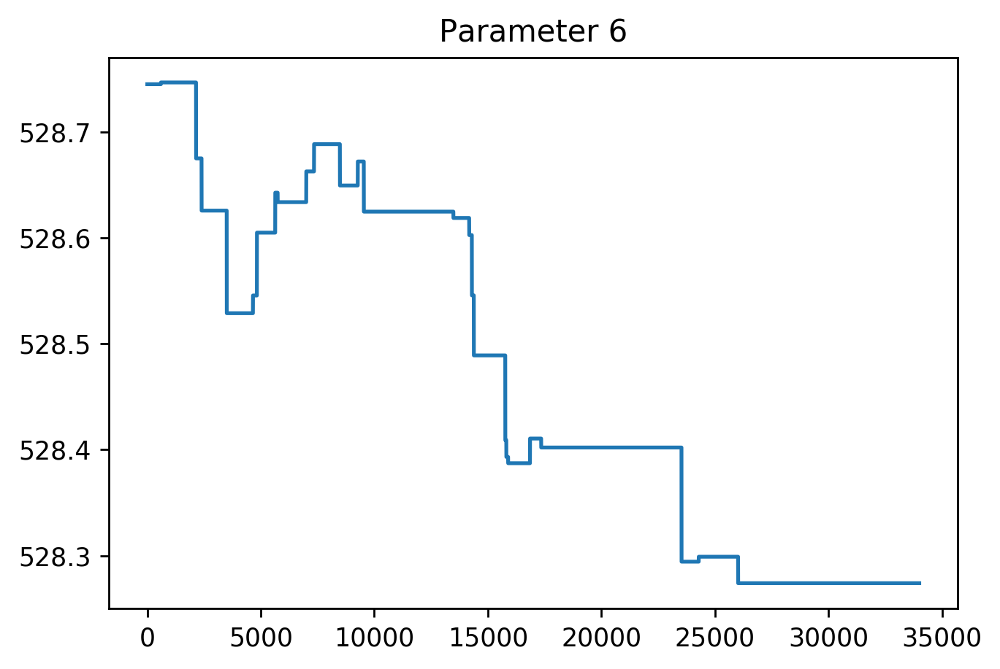

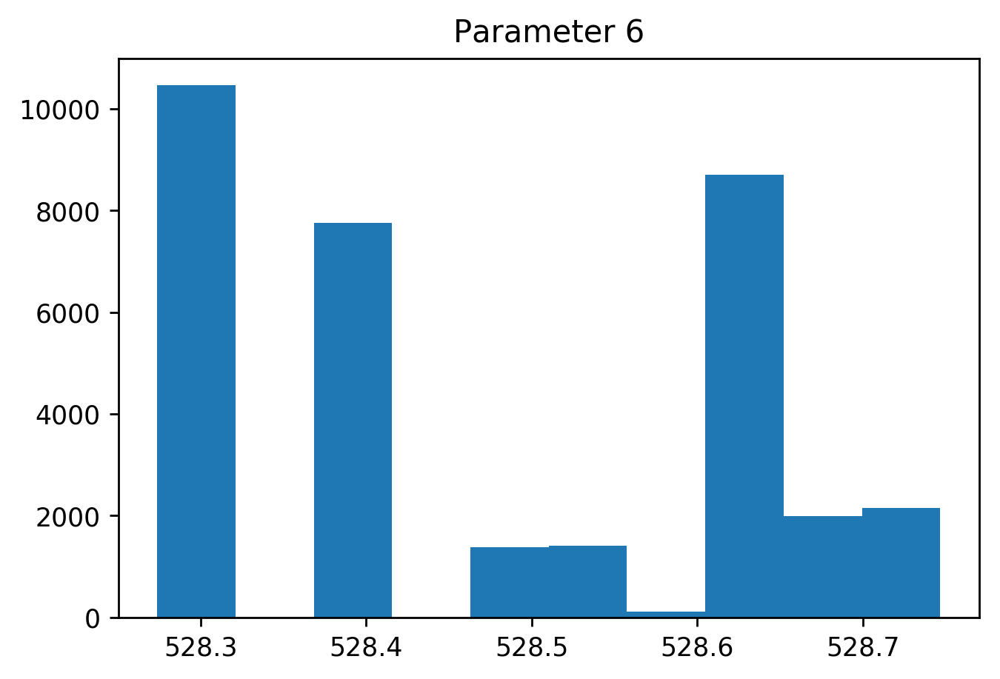

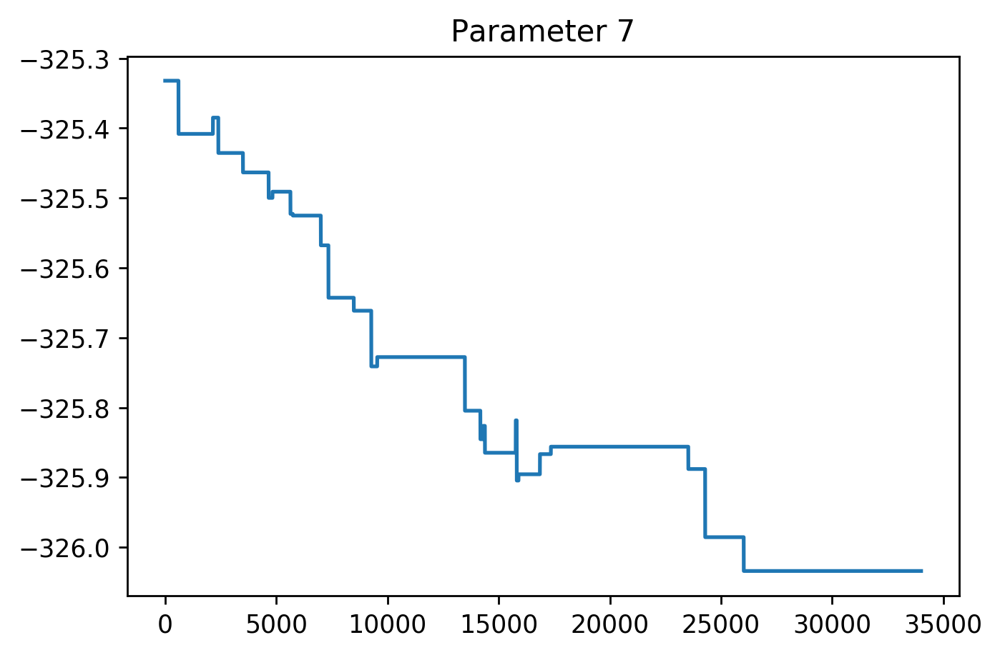

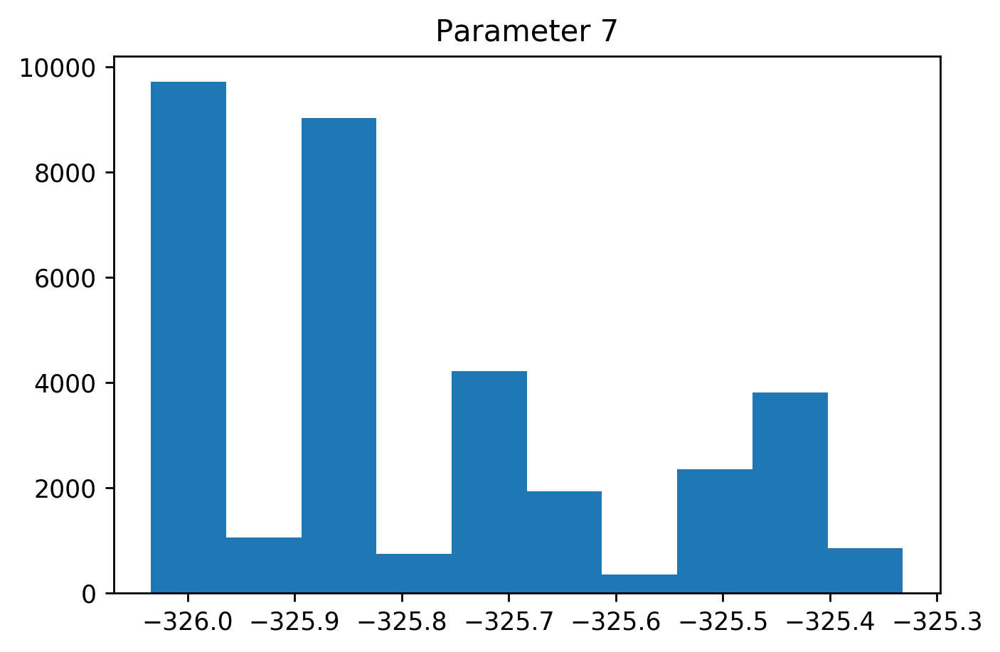

In [29]:
import numpy as np
import matplotlib.pyplot as plt

import pickle
with open('mcmcsave.pickle','rb')as f:
    sps=pickle.load(f)
sigma=sps[2]
probs=sps[1]
steps=sps[0]
      

start=40000
plt.plot(probs[start:])
plt.show()
stp=np.array(steps[start:])
for j in range(0,8):
    plt.plot(stp[start:,j])
    plt.title('Parameter %d'%j)
    plt.show()
    plt.hist(stp[start:,j])
    plt.title('Parameter %d'%j)
    plt.show()


In [15]:
print(int(np.random.rand()*18))


7
